## 5. Model Evaluation and Analysis

In [ ]:
train_set_40 = X.head(20)
lmr_train_pred_40 = lmr.predict(train_set_40)
gbr_train_pred_40 = gbr.predict(train_set_40)
rfr_train_pred_40 = rfr.predict(train_set_40)
sre_train_pred_40 = sre.predict(train_set_40)

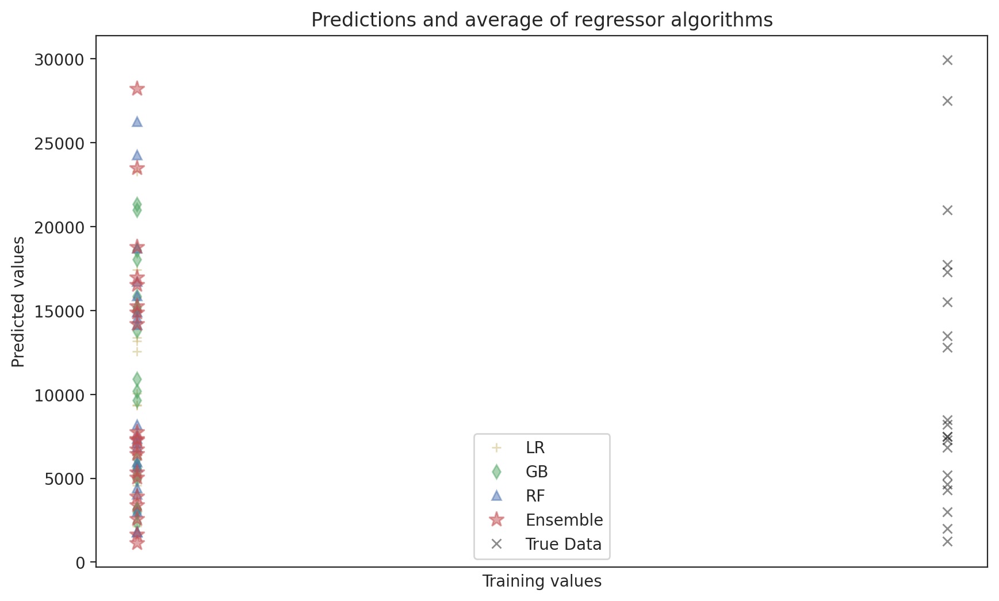

In [ ]:
plt.figure(figsize=(10,6))  # Set the figure size

# Plotting the predicted values for each algorithm
plt.plot(lmr_train_pred_40, "y+", alpha=0.5, label="LR")  # Linear Regression
plt.plot(gbr_train_pred_40, "gd", alpha=0.5, label="GB")  # Gradient Boosting
plt.plot(rfr_train_pred_40, "b^", alpha=0.5, label="RF")  # Random Forest
plt.plot(sre_train_pred_40, "r*", alpha=0.5, ms=10, label="Ensemble")  # Stacking Regressor

# Plotting the true data values
plt.plot(y.head(20), "kx", alpha=0.5, label="True Data")

# Set the x-axis parameters
plt.tick_params(axis="x", which="both", bottom=False, top=False, labelbottom=False)

# Set the labels and title
plt.ylabel("Predicted values")
plt.xlabel("Training values")
plt.legend(loc="best")
plt.title("Predictions and average of regressor algorithms")

plt.show()  # Display the plot

### 5.1 Overall Performance with Cross-Validation

In [ ]:
scores = cross_val_score(
    lmr, X_train, y_train, cv=10, scoring='neg_root_mean_squared_error'
)*-1
scores.mean(), scores.std()

(5416.178576382348, 88.11255588752663)

The Ridge Linear Regressor model, X_train as the input data, y_train as the target variable, and cv=10 to define 10-fold cross-validation are used in the code to execute cross-validation. The negative root mean squared error (neg_root_mean_squared_error) is the scoring metric that is employed.

The scores are multiplied by -1 to turn the negative values back into positive ones. then, results.Mean() determines the average root mean squared error for all folds based on the cross-validation scores. The mean root mean squared error in this instance is 5337.144434272838.


Similar to this, scores.std() determines the cross-validation scores' standard deviation, which illustrates the variability of the root mean squared error across all folds. The root mean squared error's spread or dispersion is indicated by the standard deviation, which is 100.0854659998363.

In [ ]:
scores = cross_val_score(
    rfr, X_train, y_train, cv=10, scoring='neg_root_mean_squared_error'
)*-1
scores.mean(), scores.std()

(2990.492266612516, 65.46209402721763)

The Random Forest Regressor model, X_train as the input data, y_train as the target variable, and cv=10 to define 10-fold cross-validation are all used in the code to do cross-validation. The negative root mean squared error (neg_root_mean_squared_error) is the scoring metric that is employed.

The scores are multiplied by -1 to turn the negative values back into positive ones. then, results.Mean() determines the average root mean squared error for all folds based on the cross-validation scores. The mean root mean squared error in this instance is 2985.7521705870217.


Similar to this, scores.std() determines the cross-validation scores' standard deviation, which illustrates the variability of the root mean squared error across all folds. The root mean squared error has a standard deviation of 54.6664458426862, which represents its spread or dispersion.

In [ ]:
scores = cross_val_score(
    gbr, X_train, y_train, cv=10, scoring='neg_root_mean_squared_error'
)*-1
scores.mean(), scores.std()

(3962.045896222954, 80.95361785429748)

The gbr model, X_train as the input data, y_train as the target variable, and cv=10 to define 10-fold cross-validation are all used in the code to do cross-validation. The negative root mean squared error (neg_root_mean_squared_error) is the scoring metric that is employed.

The scores are multiplied by -1 to turn the negative values back into positive ones. then, results.Mean() determines the average root mean squared error for all folds based on the cross-validation scores. The mean root mean squared error in this instance is 3895.7889032123785.


Similar to this, scores.std() determines the cross-validation scores' standard deviation, which illustrates the variability of the root mean squared error across all folds. The root mean squared error values have a standard deviation of 76.259808309496, which represents their spread or dispersion.


### 5.2 True vs Predicted Analysis

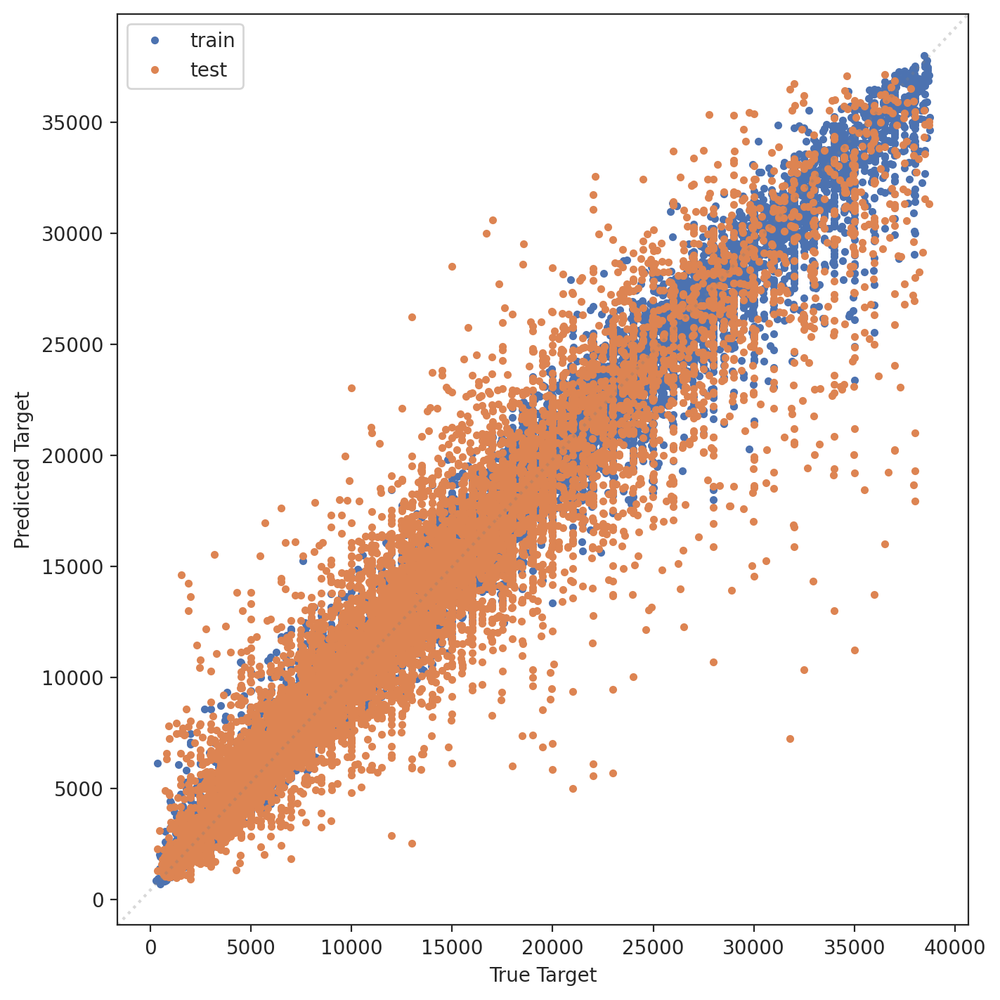

In [ ]:
fig, ax = plt.subplots(figsize=(7,7), constrained_layout=True)

ax.plot(y_train, rfr_train_prediction, '.', label='train')
ax.plot(y_test, rfr_test_prediction, '.', label='test')
ax.set_xlabel('True Target')
ax.set_ylabel('Predicted Target')
# the diagnonal line for the idealised space of predictions
ax.plot(
    [0, 1], [0, 1], transform=ax.transAxes,
    color='gray', linestyle=':', alpha=0.3
)
ax.legend()

### 5.3 Global and Local Explanations with SHAP


In [ ]:
!pip install -q shap
import shap
shap.initjs()

In [ ]:
test_pp =  rfr['preprocessor'].transform(X_test)

shap_utils = shap.utils.sample(test_pp, 400) #  Using 400 instances for distribution

explainer = shap.Explainer(lmr['regr'].predict, test_pp)
shap_values = explainer(test_pp)

Permutation explainer: 9086it [11:01, 13.50it/s]                          


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


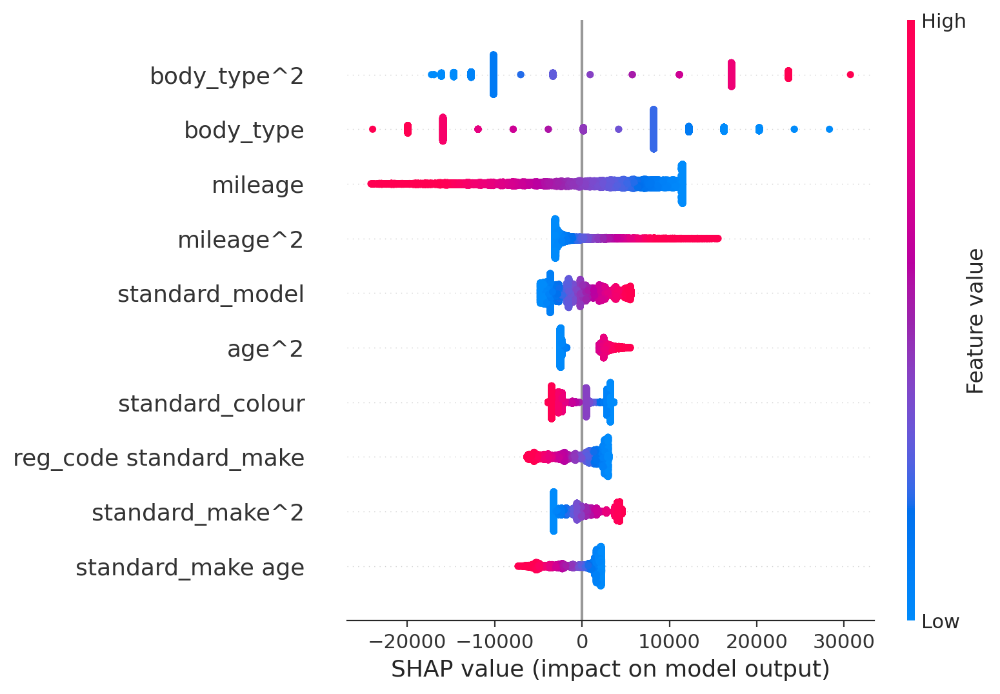

In [ ]:
shap.summary_plot(shap_values, test_pp, max_display=10)

### 5.4 Partial Dependency Plots

In [ ]:
from sklearn.inspection import PartialDependenceDisplay

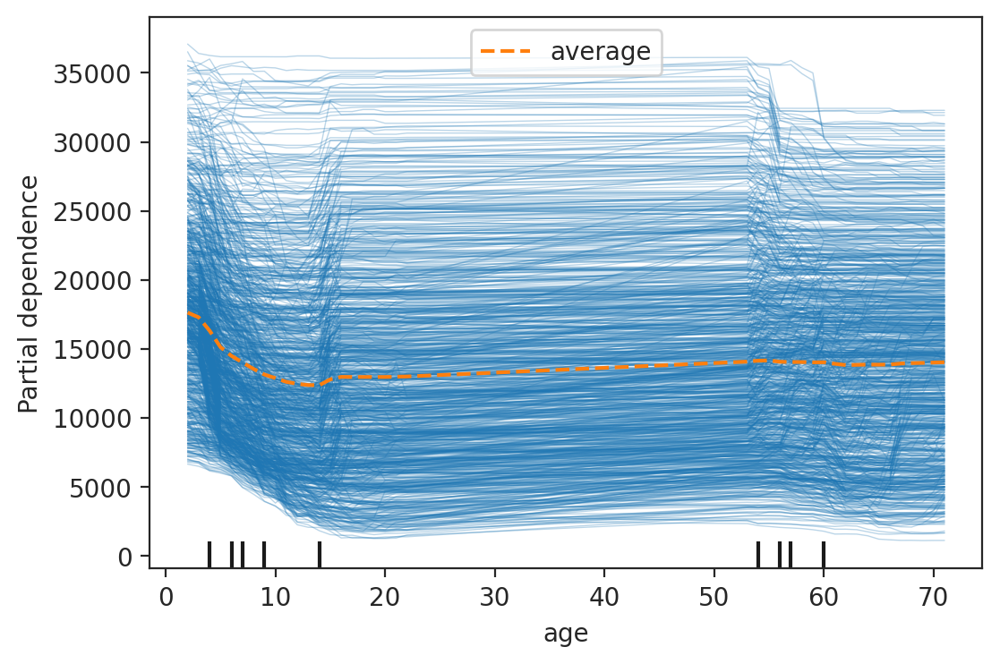

In [ ]:
PartialDependenceDisplay.from_estimator(
    rfr, X_test, features=['age'], kind='both'
);

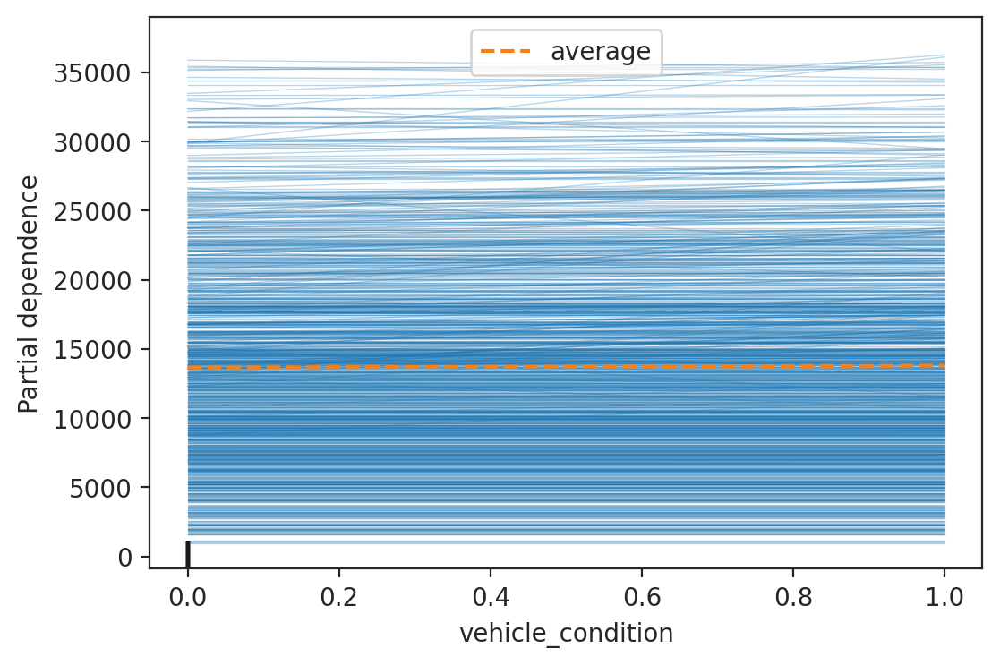

In [ ]:
PartialDependenceDisplay.from_estimator(
    rfr, X_test, features=['vehicle_condition'], kind='both'
);

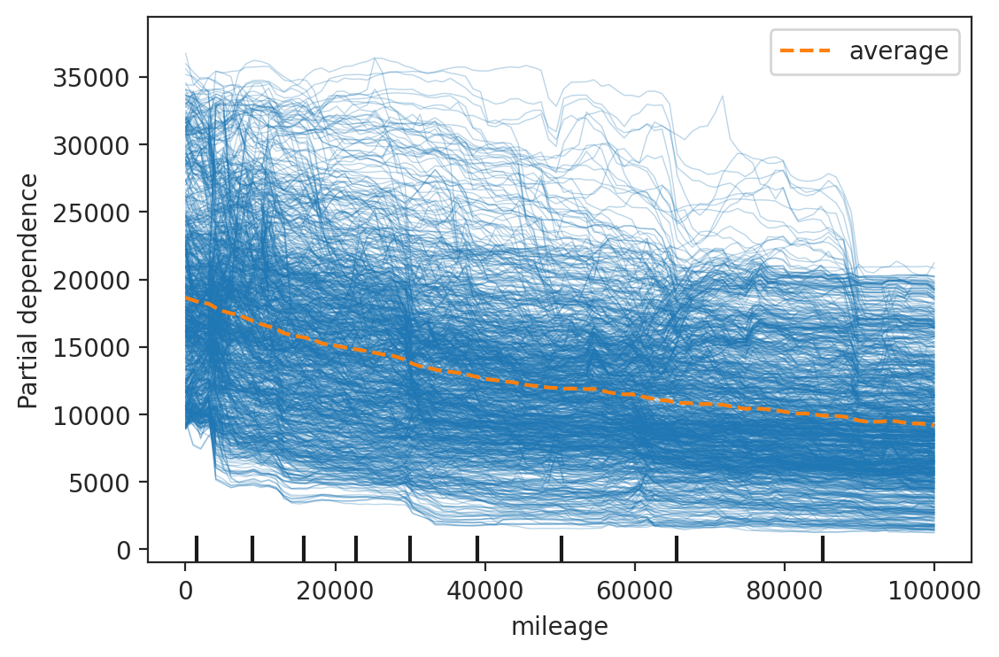

In [ ]:
PartialDependenceDisplay.from_estimator(
    rfr, X_test, features=['mileage'], kind='both'
);

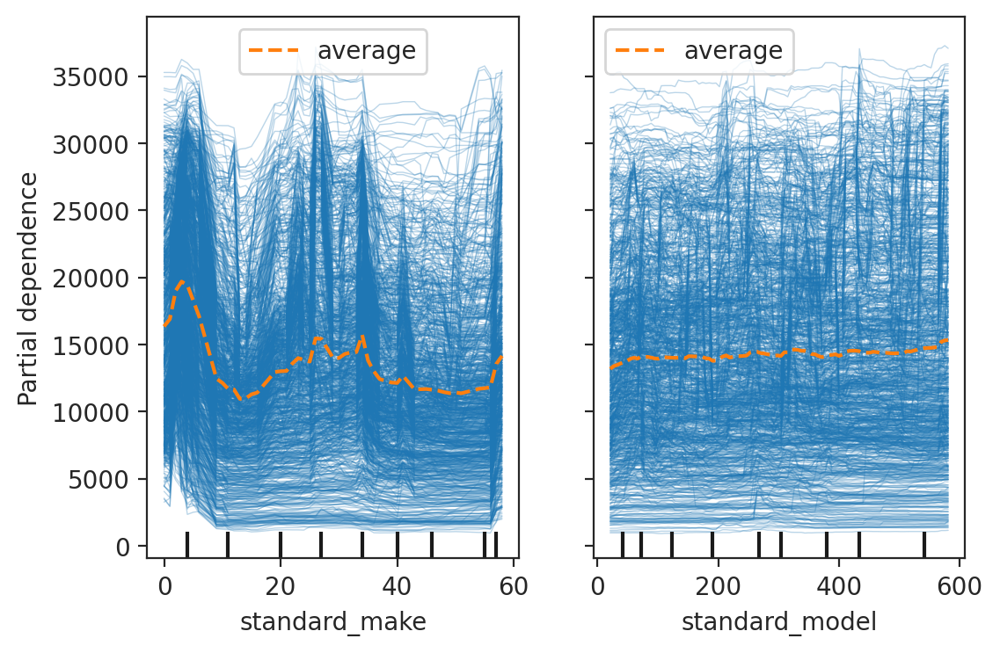

In [ ]:
PartialDependenceDisplay.from_estimator(
    rfr, X_test, features=['standard_make', 'standard_model'], kind='both'
);

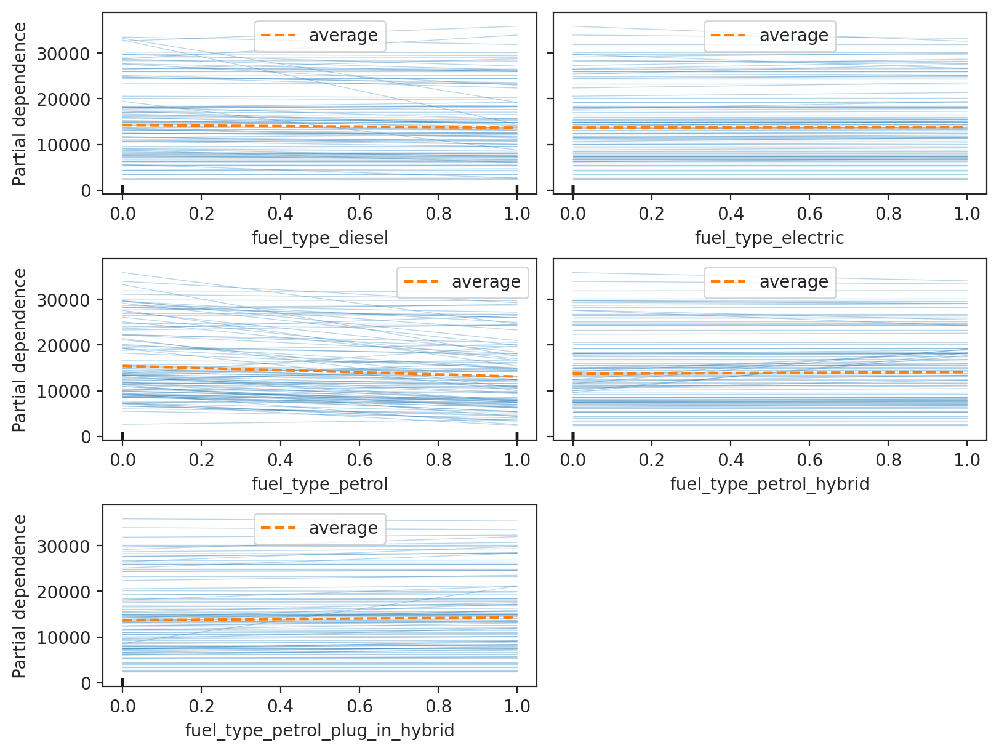

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    rfr, X_test, features=['fuel_type_diesel', 'fuel_type_electric',
       'fuel_type_petrol', 'fuel_type_petrol_hybrid',
       'fuel_type_petrol_plug_in_hybrid'],
    kind='both',
    subsample=100, grid_resolution=30, n_jobs=2, random_state=0,
    ax=ax, n_cols=2
);

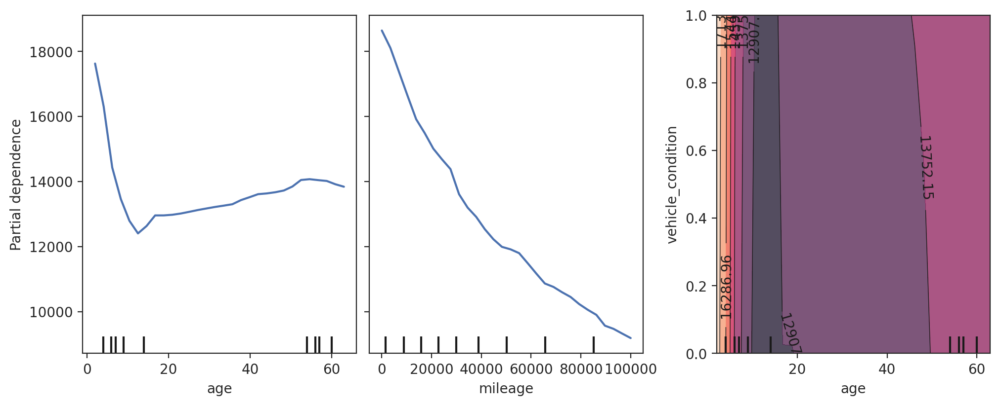

In [ ]:
fig, ax = plt.subplots(figsize=(10,4), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    rfr, X_test,
    features=["age", "mileage", ("age", "vehicle_condition")],
    kind='average',
    ax=ax, n_cols=3,
    subsample=50, grid_resolution=30, n_jobs=2, random_state=0,
);

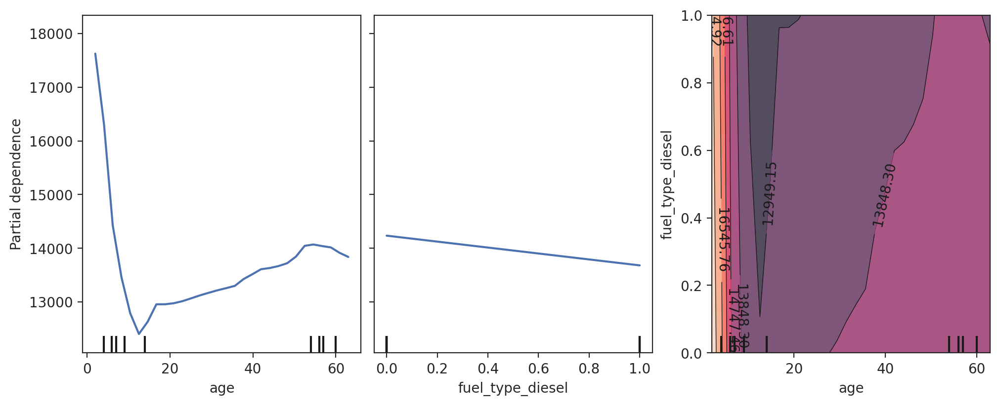

In [ ]:
fig, ax = plt.subplots(figsize=(10,4), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    rfr , X_test,
    features=["age", "fuel_type_diesel", ("age", "fuel_type_diesel")],
    kind='average',
    ax=ax, n_cols=3,
    subsample=50, grid_resolution=30, n_jobs=2, random_state=0,
);

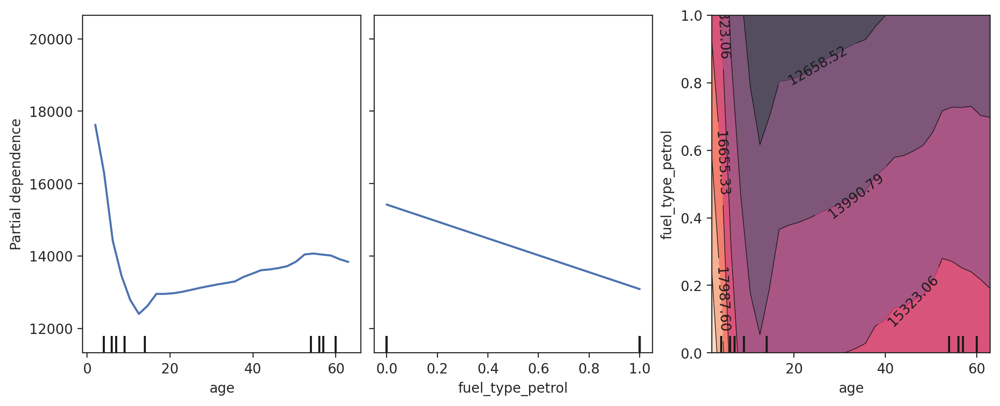

In [ ]:
fig, ax = plt.subplots(figsize=(10,4), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    rfr , X_test,
    features=["age", "fuel_type_petrol", ("age", "fuel_type_petrol")],
    kind='average',
    ax=ax, n_cols=3,
    subsample=50, grid_resolution=30, n_jobs=2, random_state=0,
);

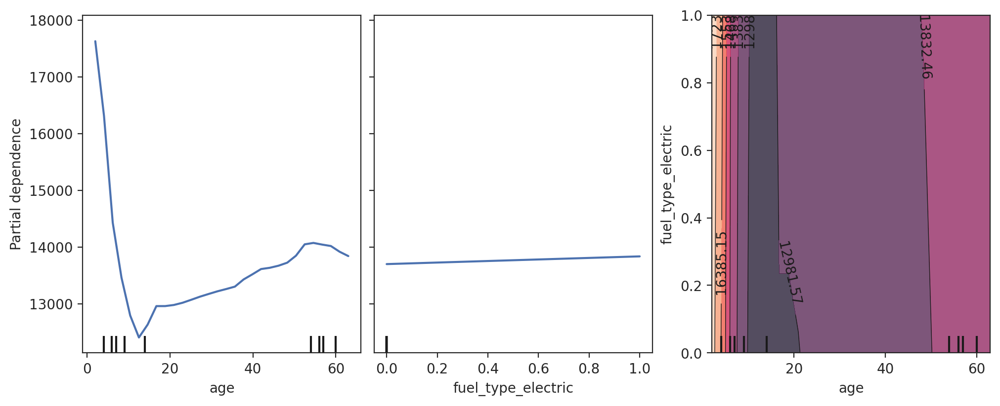

In [ ]:
fig, ax = plt.subplots(figsize=(10,4), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    rfr , X_test,
    features=["age", "fuel_type_electric", ("age", "fuel_type_electric")],
    kind='average',
    ax=ax, n_cols=3,
    subsample=50, grid_resolution=30, n_jobs=2, random_state=0,
);

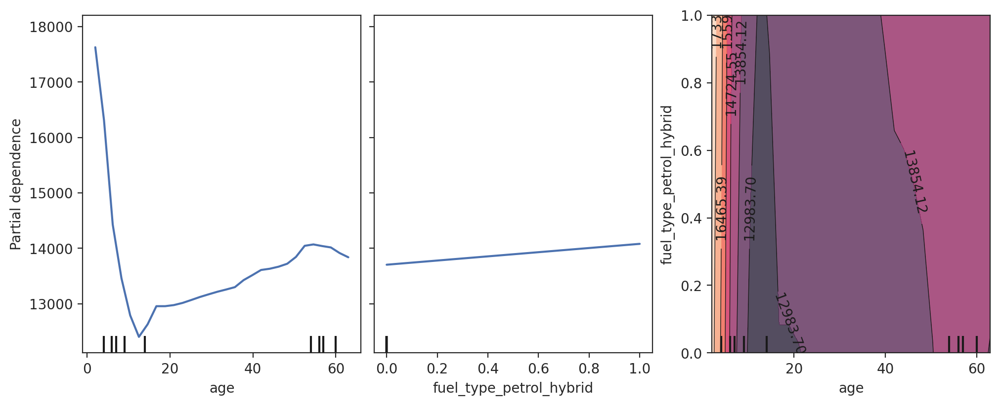

In [ ]:
fig, ax = plt.subplots(figsize=(10,4), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    rfr , X_test,
    features=["age", "fuel_type_petrol_hybrid", ("age", "fuel_type_petrol_hybrid")],
    kind='average',
    ax=ax, n_cols=3,
    subsample=50, grid_resolution=30, n_jobs=2, random_state=0,
);

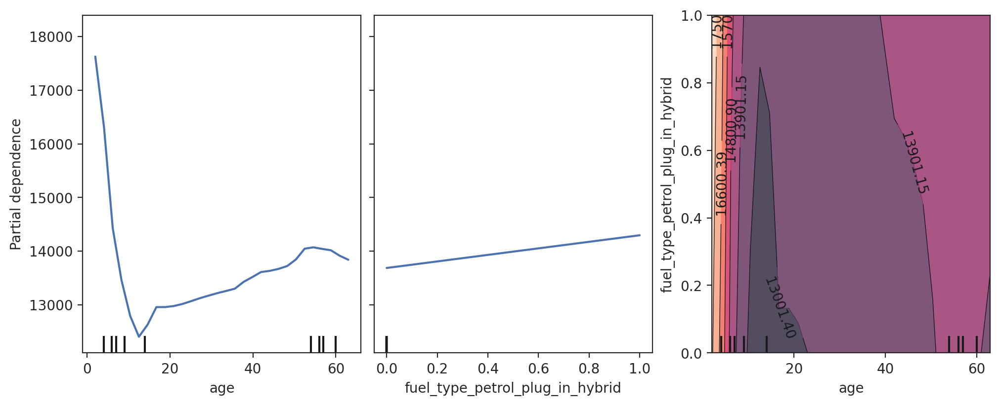

In [ ]:
fig, ax = plt.subplots(figsize=(10,4), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    rfr , X_test,
    features=["age", "fuel_type_petrol_plug_in_hybrid", ("age", "fuel_type_petrol_plug_in_hybrid")],
    kind='average',
    ax=ax, n_cols=3,
    subsample=50, grid_resolution=30, n_jobs=2, random_state=0,
);